In [0]:
!git clone https://github.com/matterport/Mask_RCNN.git

fatal: destination path 'Mask_RCNN' already exists and is not an empty directory.


In [0]:
!git clone https://github.com/cocodataset/cocoapi

fatal: destination path 'cocoapi' already exists and is not an empty directory.


In [0]:
%cd Mask_RCNN
!python3 setup.py build_ext install

/content/Mask_RCNN
running build_ext
running install
running bdist_egg
running egg_info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
reading manifest template 'MANIFEST.in'
writing manifest file 'mask_rcnn.egg-info/SOURCES.txt'
installing library code to build/bdist.linux-x86_64/egg
running install_lib
running build_py
creating build/bdist.linux-x86_64/egg
creating build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/parallel_model.py -> build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/config.py -> build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/visualize.py -> build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/__init__.py -> build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/model.py -> build/bdist.linux-x86_64/egg/mrcnn
copying build/lib/mrcnn/utils.py -> build/bdist.linux-x86_64/egg/mrcnn
byte-compiling build/bdist.linux-x8

In [0]:
!wget http://jacarini.dinf.usherbrooke.ca/static/pedestrian%20detection//pedestrian%20detection%20dataset.zip

--2020-01-29 18:34:36--  http://jacarini.dinf.usherbrooke.ca/static/pedestrian%20detection//pedestrian%20detection%20dataset.zip
Resolving jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)... 132.210.238.218
Connecting to jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)|132.210.238.218|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 679089159 (648M) [application/zip]
Saving to: ‘pedestrian detection dataset.zip.1’

pedestrian detectio 100%[===================>] 647.63M  30.0MB/s    in 22s     

2020-01-29 18:34:59 (28.9 MB/s) - ‘pedestrian detection dataset.zip.1’ saved [679089159/679089159]



In [0]:
!unzip "pedestrian detection dataset"


Archive:  pedestrian detection dataset.zip
   creating: pedestrian detection dataset/
   creating: pedestrian detection dataset/PETS2006/
  inflating: pedestrian detection dataset/PETS2006/gt.txt  
   creating: pedestrian detection dataset/PETS2006/input/
  inflating: pedestrian detection dataset/PETS2006/input/in000001.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000002.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000003.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000004.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000005.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000006.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000007.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000008.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000009.jpg  
  inflating: pedestrian detection dataset/PETS2006/input/in000010.jpg  
  inflating: pedestrian 

In [0]:
!pip3 install -U scikit-image
!pip3 install -U cython 
!pip3 install "git+https://github.com/philferriere/cocoapi.git#egg=pycocotools&subdirectory=PythonAPI"


Requirement already up-to-date: scikit-image in /usr/local/lib/python3.6/dist-packages (0.16.2)
Requirement already up-to-date: cython in /usr/local/lib/python3.6/dist-packages (0.29.14)


In [0]:
# USAGE
# python mask_rcnn.py --mask-rcnn mask-rcnn-coco --image images/example_01.jpg
# python mask_rcnn.py --mask-rcnn mask-rcnn-coco --image images/example_03.jpg --visualize 1

# import the necessary packages
import numpy as np
import argparse
import random
import time
import cv2
import os
import cython
import matplotlib
import sklearn
import tensorflow
import keras
import cv2
import h5py
import imgaug
import IPython
import skimage
import matplotlib.pyplot as plt
import os
import sys




Using TensorFlow backend.


In [0]:
# Root directory of the project
ROOT_DIR =  os.getcwd()  #os.path.abspath("../")

import warnings
warnings.filterwarnings("ignore")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))  # To find local version
import coco

%matplotlib inline

In [0]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join('', "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")

In [0]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                93
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [0]:
# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir='mask_rcnn_coco.hy', config=config)

# Load weights trained on MS-COCO
model.load_weights('mask_rcnn_coco.h5', by_name=True)








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.








In [0]:
#Class names
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

In [0]:
mask = r['masks']
mask = mask.astype(int)
mask.shape

(480, 720, 3)

In [0]:
#Load from the bad weather (blizzard) dataset
!wget http://jacarini.dinf.usherbrooke.ca/static/dataset/badWeather/blizzard.zip
!unzip "blizzard"

--2020-01-29 19:33:20--  http://jacarini.dinf.usherbrooke.ca/static/dataset/badWeather/blizzard.zip
Resolving jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)... 132.210.238.218
Connecting to jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)|132.210.238.218|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79027548 (75M) [application/zip]
Saving to: ‘blizzard.zip.1’

blizzard.zip.1      100%[===================>]  75.37M  23.7MB/s    in 3.2s    

2020-01-29 19:33:23 (23.7 MB/s) - ‘blizzard.zip.1’ saved [79027548/79027548]

Archive:  blizzard.zip
   creating: blizzard/
  inflating: blizzard/ROI.bmp        
  inflating: blizzard/ROI.jpg        
   creating: blizzard/groundtruth/
  inflating: blizzard/groundtruth/gt000001.png  
  inflating: blizzard/groundtruth/gt000002.png  
  inflating: blizzard/groundtruth/gt000003.png  
  inflating: blizzard/groundtruth/gt000004.png  
  inflating: blizzard/groundtruth/gt000005.png  
  inflating: blizzard/gro

In [0]:
#Load from the nighttime dataset
!wget http://jacarini.dinf.usherbrooke.ca/static/dataset/nightVideos.zip
!unzip "nightVideos"

--2020-01-29 19:33:42--  http://jacarini.dinf.usherbrooke.ca/static/dataset/nightVideos.zip
Resolving jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)... 132.210.238.218
Connecting to jacarini.dinf.usherbrooke.ca (jacarini.dinf.usherbrooke.ca)|132.210.238.218|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 318634228 (304M) [application/zip]
Saving to: ‘nightVideos.zip’

nightVideos.zip     100%[===================>] 303.87M  30.6MB/s    in 11s     

2020-01-29 19:33:53 (28.7 MB/s) - ‘nightVideos.zip’ saved [318634228/318634228]

Archive:  nightVideos.zip
  inflating: README.txt              
   creating: nightVideos/
   creating: nightVideos/bridgeEntry/
  inflating: nightVideos/bridgeEntry/ROI.bmp  
  inflating: nightVideos/bridgeEntry/ROI.jpg  
   creating: nightVideos/bridgeEntry/groundtruth/
  inflating: nightVideos/bridgeEntry/groundtruth/gt000001.png  
  inflating: nightVideos/bridgeEntry/groundtruth/gt000002.png  
  inflating: nightVideos/brid

Processing 1 images
image                    shape: (240, 360, 3)         min:   24.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


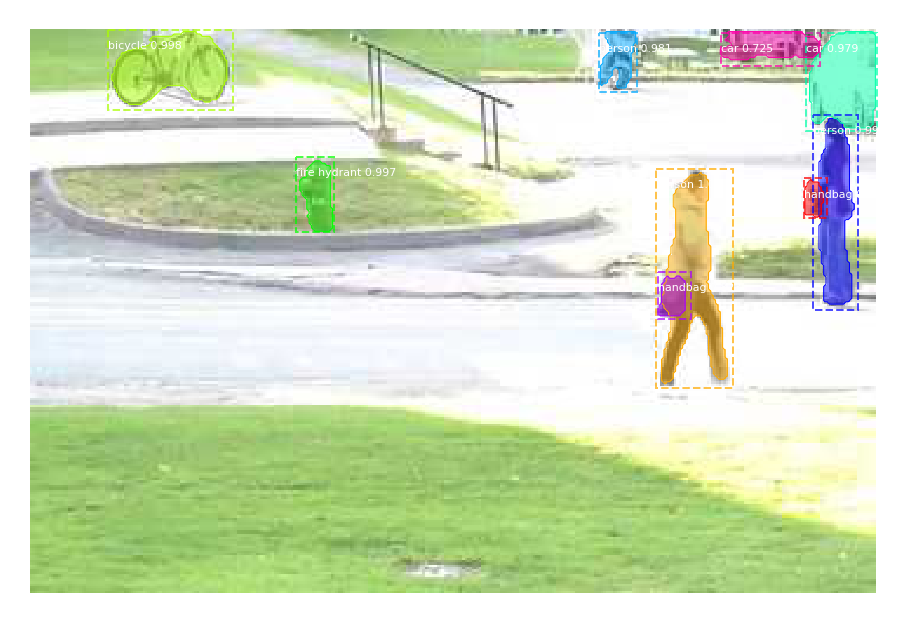

Processing 1 images
image                    shape: (240, 360, 3)         min:   29.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


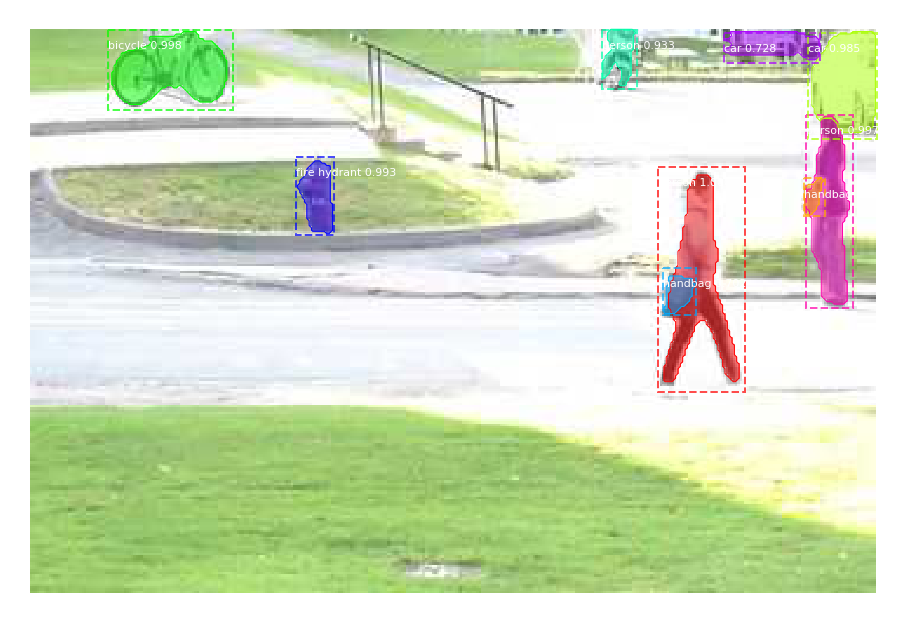

Processing 1 images
image                    shape: (240, 360, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


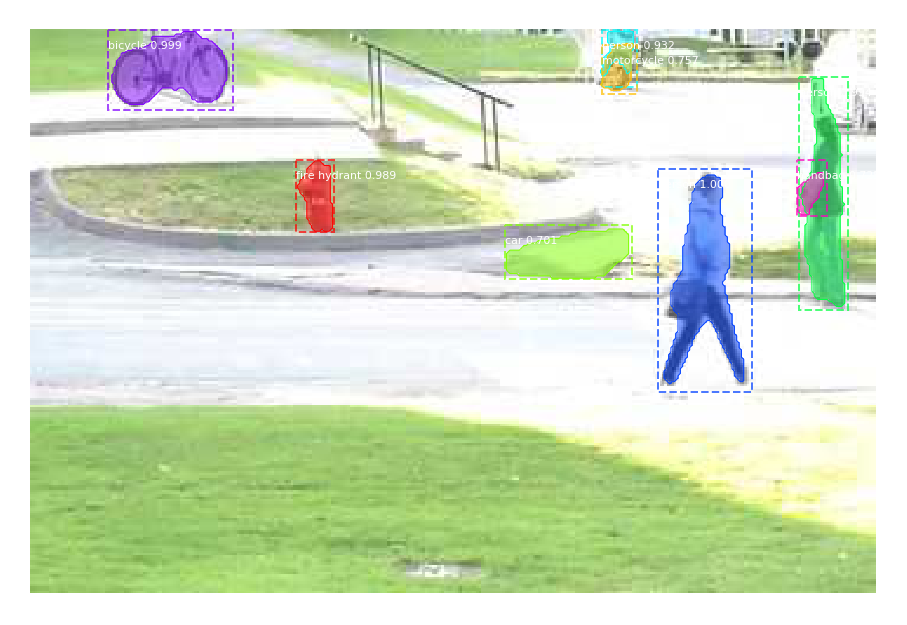

Processing 1 images
image                    shape: (240, 360, 3)         min:   32.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


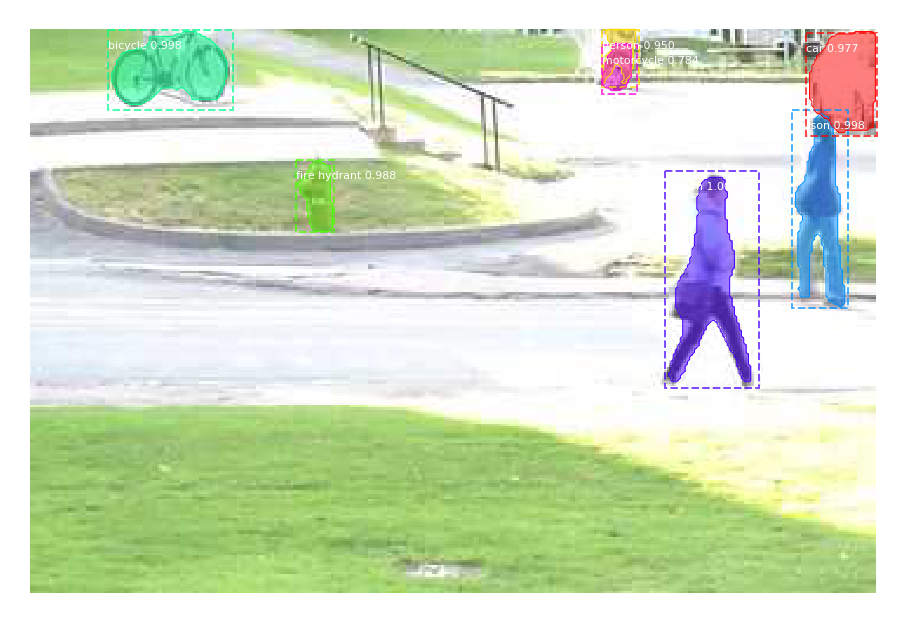

Processing 1 images
image                    shape: (240, 360, 3)         min:   31.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


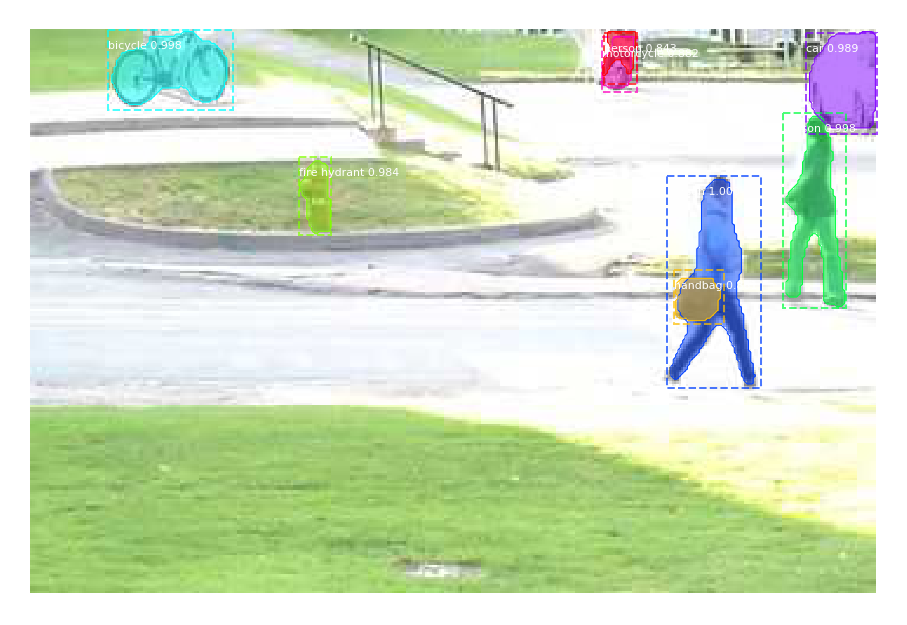

Processing 1 images
image                    shape: (240, 360, 3)         min:   30.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


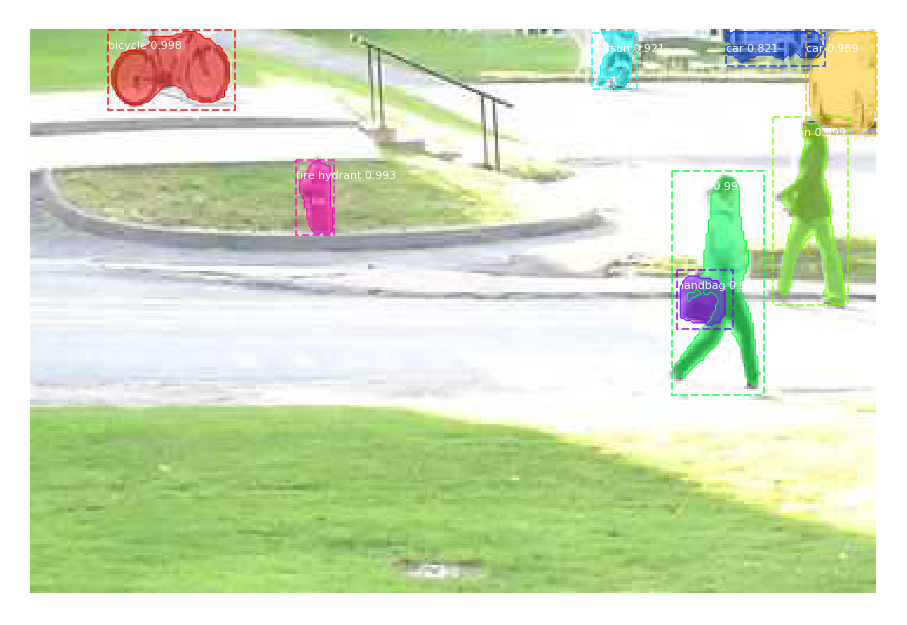

In [0]:
# Load and process five frames from the baseline pedestrians dataset
#frames in000417 - in000422
directory = '/content/Mask_RCNN/Mask_RCNN/pedestrian detection dataset/pedestrians/input'
frames = ["in000417.jpg", "in000418.jpg", "in000419.jpg", "in000420.jpg", "in000421.jpg", "in000422.jpg"]
for file in frames:
    image = skimage.io.imread(os.path.join("/content/Mask_RCNN/Mask_RCNN/pedestrian detection dataset/pedestrians/input", file))
    # Run detection
    results = model.detect([image], verbose=1)
    # Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                        class_names, r['scores'])

Processing 1 images
image                    shape: (480, 720, 3)         min:   82.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  140.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


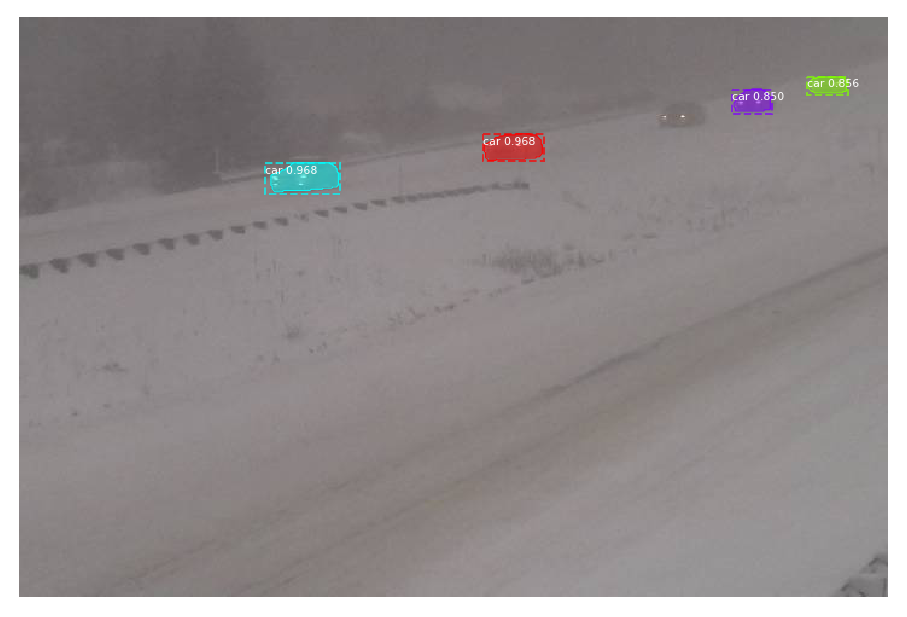

Processing 1 images
image                    shape: (480, 720, 3)         min:   86.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


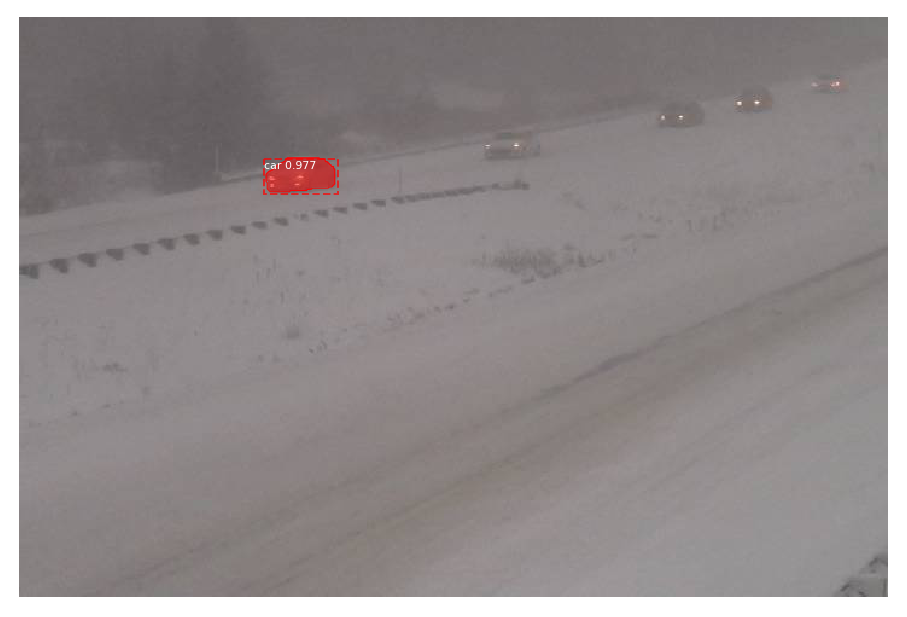

Processing 1 images
image                    shape: (480, 720, 3)         min:   87.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  129.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


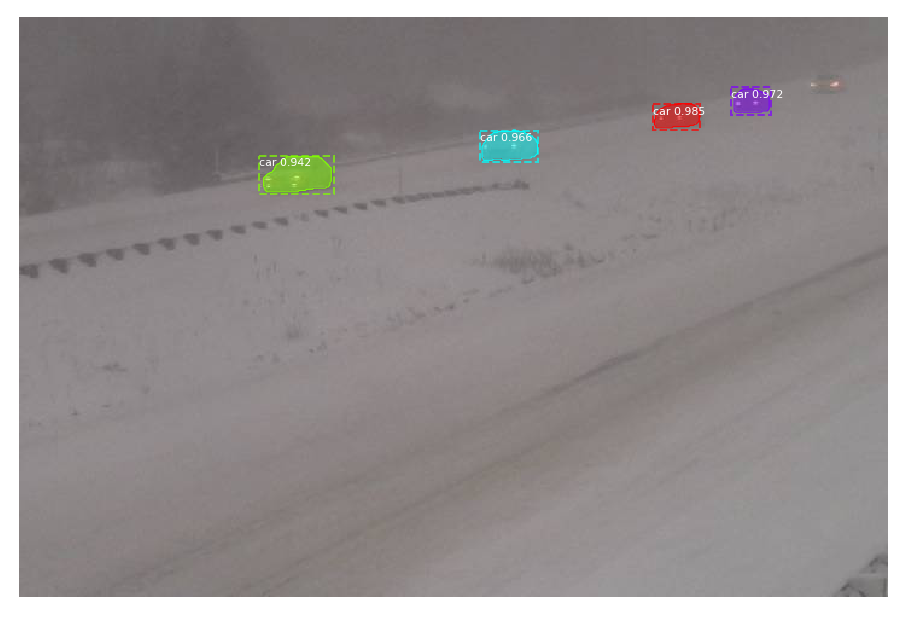

Processing 1 images
image                    shape: (480, 720, 3)         min:   84.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


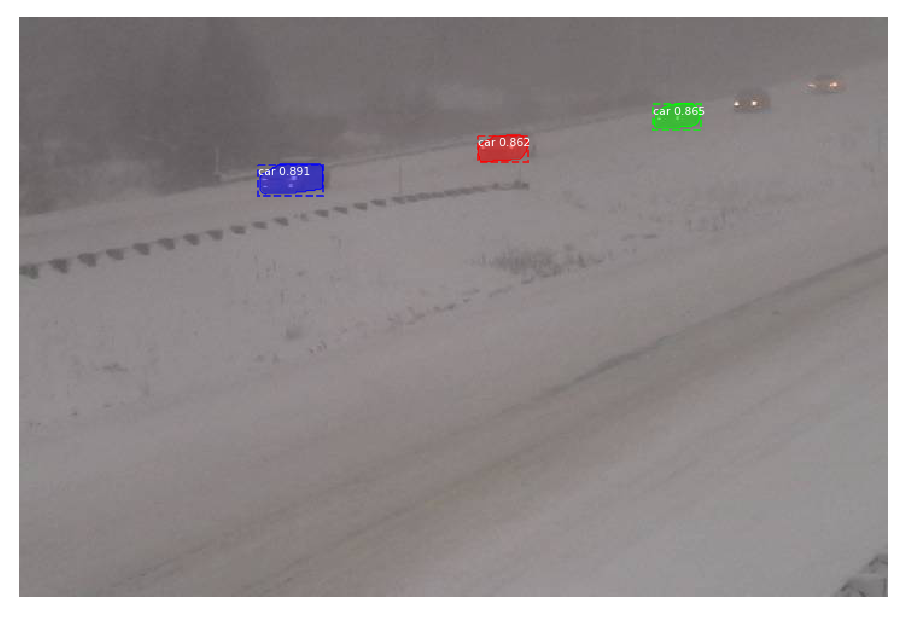

Processing 1 images
image                    shape: (480, 720, 3)         min:   84.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


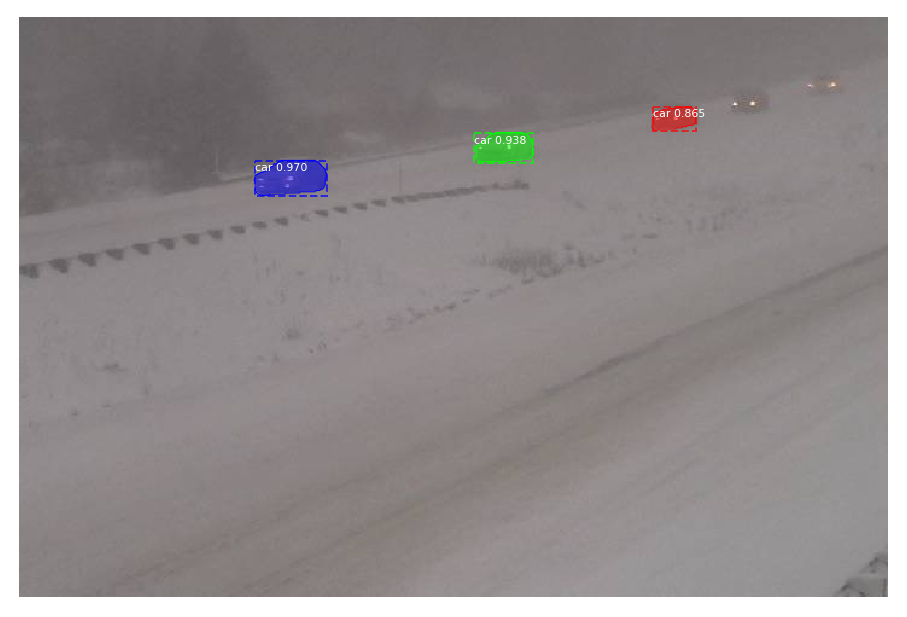

Processing 1 images
image                    shape: (480, 720, 3)         min:   87.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  131.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


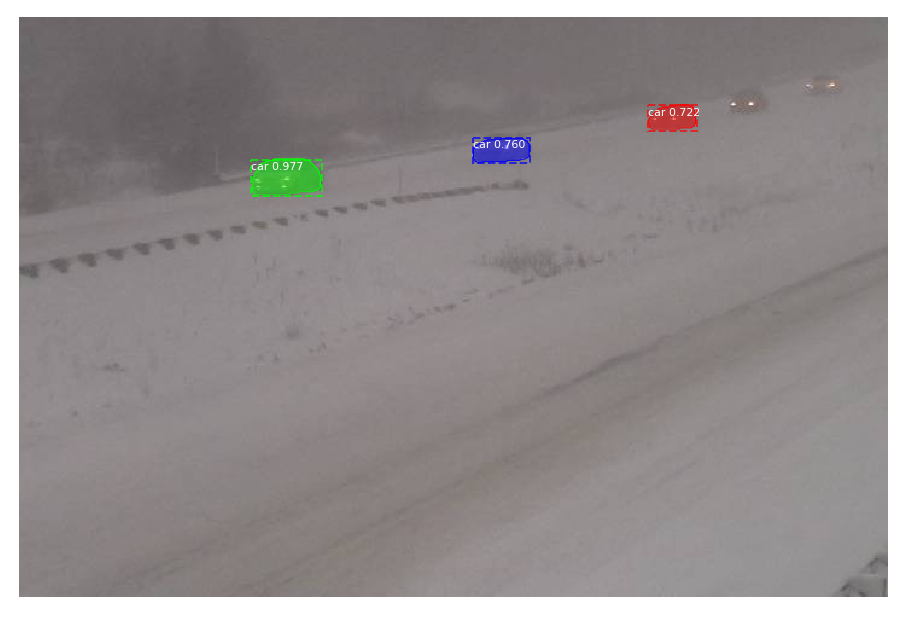

In [0]:
#Testing under the blizzard environmental condition

directory = '/content/Mask_RCNN/blizzard/input'
frames = ["in001023.jpg", "in001024.jpg", "in001025.jpg", "in001026.jpg", "in001027.jpg", "in001028.jpg"]
for file in frames:
    image = skimage.io.imread(os.path.join("/content/Mask_RCNN/blizzard/input", file))
    # Run detection
    results = model.detect([image], verbose=1)
    # Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                        class_names, r['scores'])

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


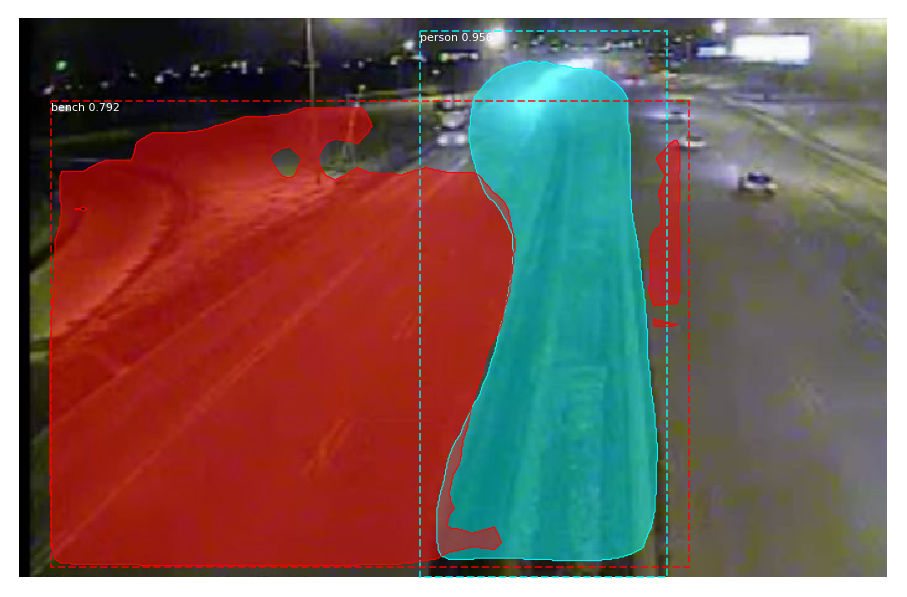

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


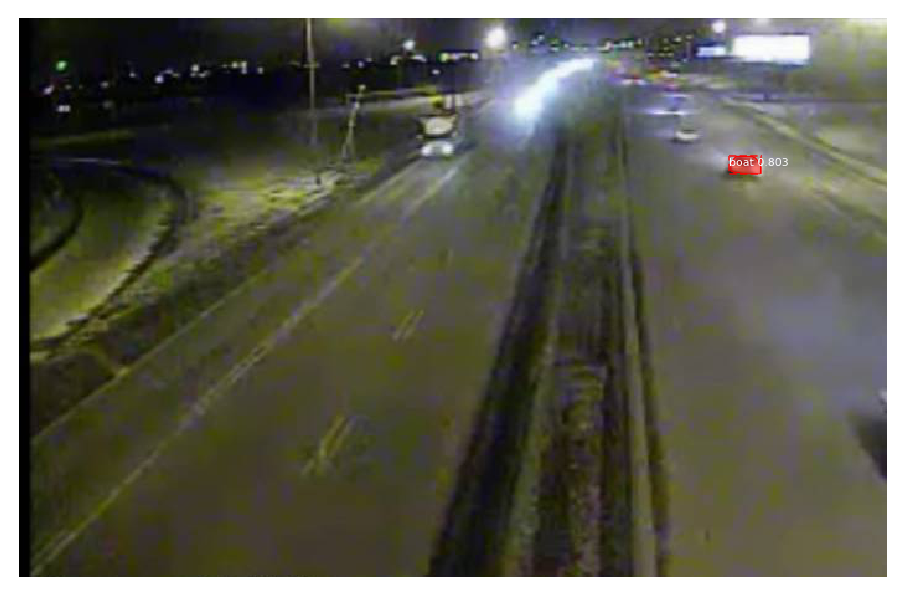

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


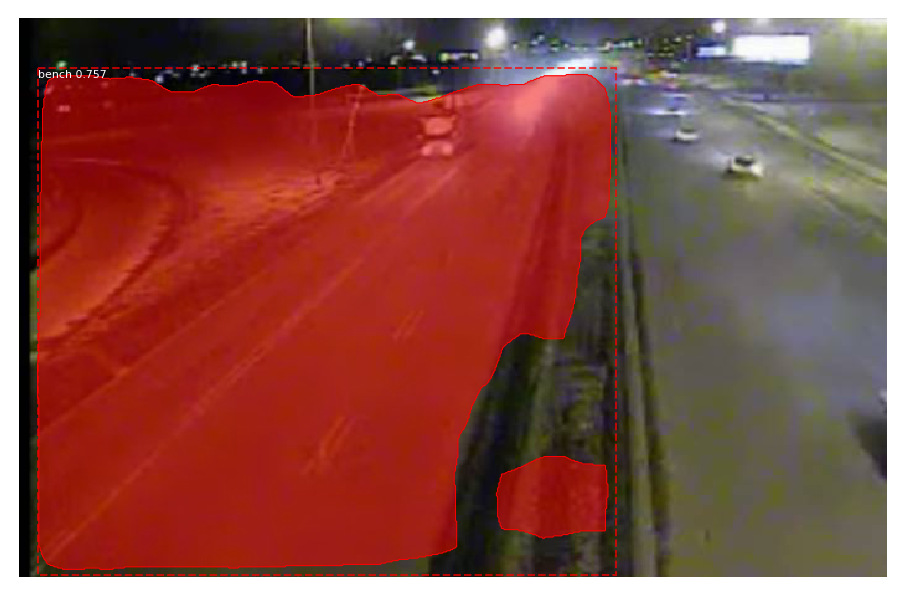

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


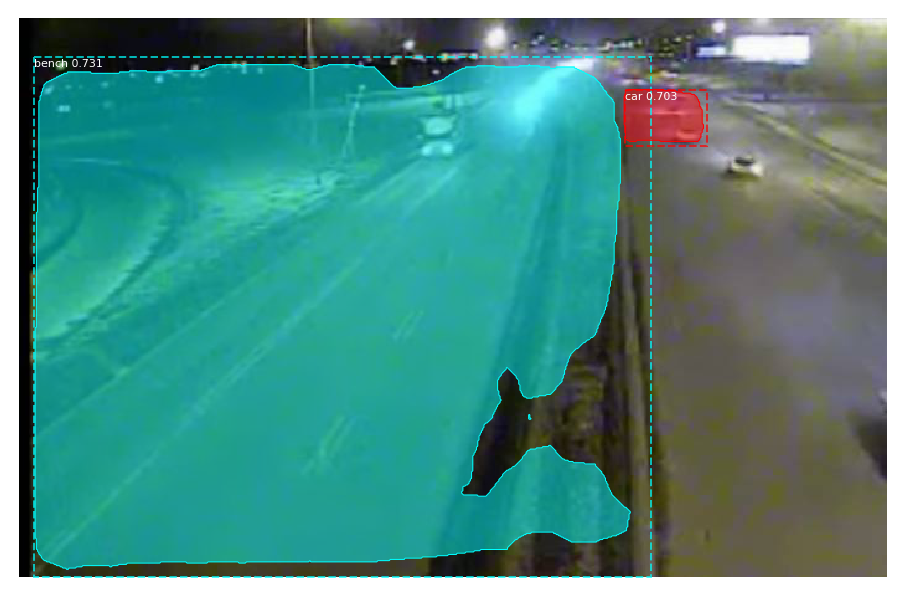

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


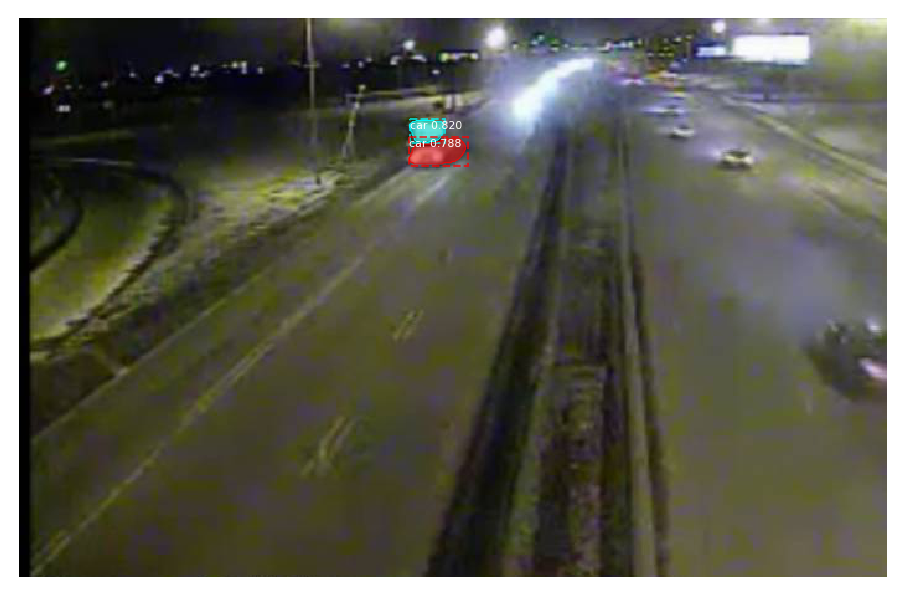

Processing 1 images
image                    shape: (450, 700, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 1024.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


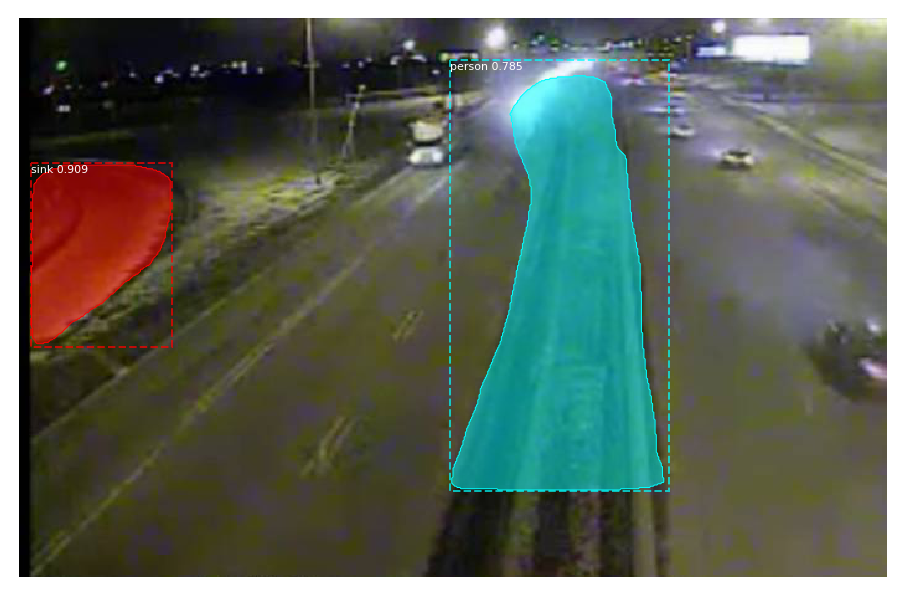

In [0]:
#Testing under the nighttime environmental condition

directory = '/content/Mask_RCNN/nightVideos/input'
frames = ["in000004.jpg", "in000005.jpg", "in000006.jpg", "in000007.jpg", "in000008.jpg", "in000009.jpg"]
for file in frames:
    image = skimage.io.imread(os.path.join("/content/Mask_RCNN/nightVideos/fluidHighway/input", file))
    # Run detection
    results = model.detect([image], verbose=1)
    # Visualize results
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'],
                        class_names, r['scores'])

In [0]:
# import the necessary packages
from collections import namedtuple
import numpy as np
import cv2
 
# define the `Detection` object
Detection = namedtuple("Detection", ["image_path", "gt", "pred"])

In [0]:
#Calculating IoU

def bb_intersection_over_union(boxA, boxB):
	# determine the (x, y)-coordinates of the intersection rectangle
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
 
	# compute the area of intersection rectangle
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
 
	# compute the area of both the prediction and ground-truth
	# rectangles
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
 
	# compute the intersection over union by taking the intersection
	# area and dividing it by the sum of prediction + ground-truth
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
 
	# return the intersection over union value
	return iou

In [0]:
examples = [
	Detection("image_0002.jpg", [39, 63, 203, 112], [54, 66, 198, 114]),
	Detection("image_0016.jpg", [49, 75, 203, 125], [42, 78, 186, 126]),
	Detection("image_0075.jpg", [31, 69, 201, 125], [18, 63, 235, 135]),
	Detection("image_0090.jpg", [50, 72, 197, 121], [54, 72, 198, 120]),
	Detection("image_0120.jpg", [35, 51, 196, 110], [36, 60, 180, 108])]
  


In [0]:
# loop over the example detections
for detection in examples:
	# load the image
	image = cv2.imread(detection.image_path)
 
	# draw the ground-truth bounding box along with the predicted
	# bounding box
	cv2.rectangle(image, tuple(detection.gt[:2]), 
		tuple(detection.gt[2:]), (0, 255, 0), 2)
	cv2.rectangle(image, tuple(detection.pred[:2]), 
		tuple(detection.pred[2:]), (0, 0, 255), 2)
 
	# compute the intersection over union and display it
	iou = bb_intersection_over_union(detection.gt, detection.pred)
	cv2.putText(image, "IoU: {:.4f}".format(iou), (10, 30),
		cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
	print("{}: {:.4f}".format(detection.image_path, iou))
 
	# show the output image
	cv2.imshow("Image", image)
	cv2.waitKey(0)